In [1]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go # visualize point clouds
import cv2
import math
import os
import pandas as pd

## Filestructure
You can download the data in the LiDAR/RADAR moodle course (Dataset2022): https://elearning.rwu.de/course/view.php?id=2344.  
The downloaded file is a zip, to use it you have to unzip it.  
After unzipping you will find two folders in _Dataset2022_ you will find two folders:
* _record1_ - forth and back drive of the car (240 Frames)
* _record2_ - right to left drive of the car (100 Frames)

Inside every recording folder you find 5 folders:
* _blickfeld_ - containing the data from the Blickfeld Cube (.csv files)
* _camera_ - containing the data from the camera (.jpg files)
* _groundtruth_ - containing the data for the bounding box around the vehicel (.csv files)
* _radar_ - containing the data from the Texas Instruments RADAR (.csv files)
* _velodyne_ - containing the data from the Velodyne Puck (.csv files)

So we can set pathes to the data:

In [2]:
record_number = 3 # Either record 1 or record 2

root = f"C:/Users/IEM-Laptop15/Downloads/record3/record3/"
path_blickfeld = f"{root}/blickfeld"
path_camera = f"{root}/camera"
path_radar = f"{root}/radar"
path_velodyne = f"{root}/velodyne"

### Loading the data
To work with the data we have to load it into our python script. The data here are either .jpg files or .csv files. There are multiple ways to load these types of files. We will present here one way.
#### Loading .csv files
CSV is an acronym for Comma-Separated Values. While typically commas are used to seperate the values, they can also be seperated by whitespace or other symbols. In our files the data is seperated by whitespaces. Hence, for loading the data we will use the numpy function loadtxt (https://numpy.org/doc/stable/reference/generated/numpy.loadtxt.html). Because of the given datastructure, we can use the default parameters of loadtxt and just have to give the file path.  
As .csv files are the point clouds stored and the groundtruth.
#### Loading .jpg files
JPG files contain an compressed digital image. To load this we will use here a the function imread from cv2 (https://docs.opencv.org/3.4/d4/da8/group__imgcodecs.html#ga288b8b3da0892bd651fce07b3bbd3a56). The function also just takes the image path.

In [3]:
def readPC(path):
    """
       Will return a numpy array of
       shape:
       Nx4 for LiDAR Data (x,y,z,itensity)
       Nx5 for RADAR Data (x,y,z,velocity,itensity)
       
    """
    return np.loadtxt(path)

def readImage(path):
    """
       Will return an numpy array of
       shape height x width x 3.
    """
    return cv2.imread(path) #[:,:,[2,1,0]]   #### cv2.imread() method loads an image from the specified file

def readLabels(path):
    """
       Reads the ground truth labels.
       In the labels are the following
       information stored:
       1. width in m
       2. length in m
       3. height in m
       4.-6. Coordinates of the center in m
       7. yaw rotation in degree
    """
    return np.loadtxt(path)

In [4]:
frame_id = 1


pc_radar = readPC(f"{path_radar}/{frame_id:06d}.csv")
print(f"{path_radar}/{frame_id:06d}.csv")


img = readImage(f"{path_camera}/{frame_id:06d}.jpg")
print(f"{path_camera}/{frame_id:06d}.jpg")

C:/Users/IEM-Laptop15/Downloads/record3/record3//radar/000001.csv
C:/Users/IEM-Laptop15/Downloads/record3/record3//camera/000001.jpg


In [5]:
 ### To get the dimensions of the array

print(f"Radar point cloud shape: {pc_radar.shape}\n\
Image shape: {img.shape}")  ### The output gives the dimensions variable to get width, height and number of channels for each pixel.

### width : 720
### height : 1280
### No of channels per pixel : 3

Radar point cloud shape: (291, 5)
Image shape: (720, 1280, 3)


In [6]:
pc_radar

array([[ 2.40220517e-01,  1.52744460e+00,  2.05991462e-01,
         0.00000000e+00,  1.89418049e+01],
       [-1.49385822e+00,  1.08979869e+00,  2.90811479e-01,
         0.00000000e+00,  2.18518143e+01],
       [-1.50168312e+00,  1.03488231e+00, -4.21676636e-01,
         0.00000000e+00,  2.18518143e+01],
       ...,
       [ 2.47159910e+00,  5.29718895e+01,  8.23965847e-01,
         1.57719624e+00,  1.11286201e+01],
       [ 1.75217452e-13,  5.19429626e+01,  1.07115555e+01,
         1.57719624e+00,  1.11286201e+01],
       [-8.04239631e-01,  5.17599602e+01,  1.15355215e+01,
         1.57719624e+00,  1.11286201e+01]])

In [7]:
img

array([[[253, 254, 198],
        [253, 254, 198],
        [253, 254, 198],
        ...,
        [255, 255, 224],
        [255, 255, 224],
        [255, 255, 224]],

       [[253, 254, 198],
        [253, 254, 198],
        [253, 254, 198],
        ...,
        [255, 255, 224],
        [255, 255, 224],
        [255, 255, 224]],

       [[253, 254, 198],
        [253, 254, 198],
        [253, 254, 198],
        ...,
        [255, 255, 224],
        [255, 255, 224],
        [255, 255, 224]],

       ...,

       [[103,  97,  78],
        [103,  97,  78],
        [103,  97,  78],
        ...,
        [ 84,  72,  68],
        [ 97,  85,  79],
        [105,  93,  87]],

       [[ 95,  89,  70],
        [ 94,  88,  69],
        [ 94,  88,  69],
        ...,
        [ 99,  87,  81],
        [ 98,  86,  80],
        [ 93,  81,  75]],

       [[107, 101,  82],
        [102,  96,  77],
        [ 99,  93,  74],
        ...,
        [107,  95,  89],
        [101,  89,  83],
        [ 82,  70,  64]]

## Visualization
To understand the data easier, we visualize them. We can use the package matplotlib.pyplot and/or plotly.

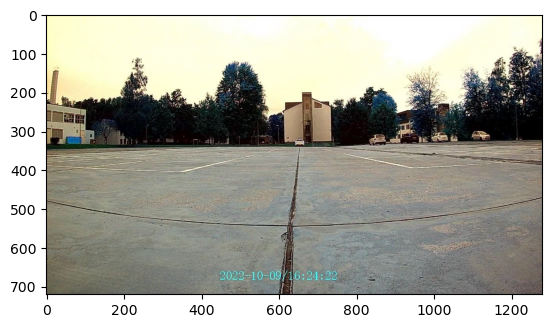

In [8]:
plt.imshow(img) # cv2 color order is (blue, green, red) 
                # and of matplotlib.pyplot is (red, green, blue)

In [9]:
def readImage(path):
    """
       Will return an numpy array of
       shape height x width x 3.
    """
    return cv2.imread(path)[:,:,[2,1,0]]    ### cv2.imread() method loads an image from the specified path

In [10]:
img = readImage(f"{path_camera}/{frame_id:06d}.jpg")
print(f"{path_camera}/{frame_id:06d}.jpg")

C:/Users/IEM-Laptop15/Downloads/record3/record3//camera/000001.jpg


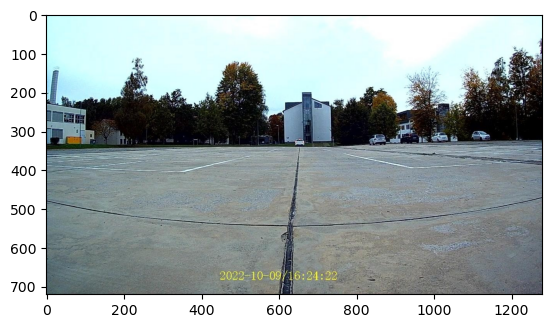

In [11]:
plt.imshow(img)

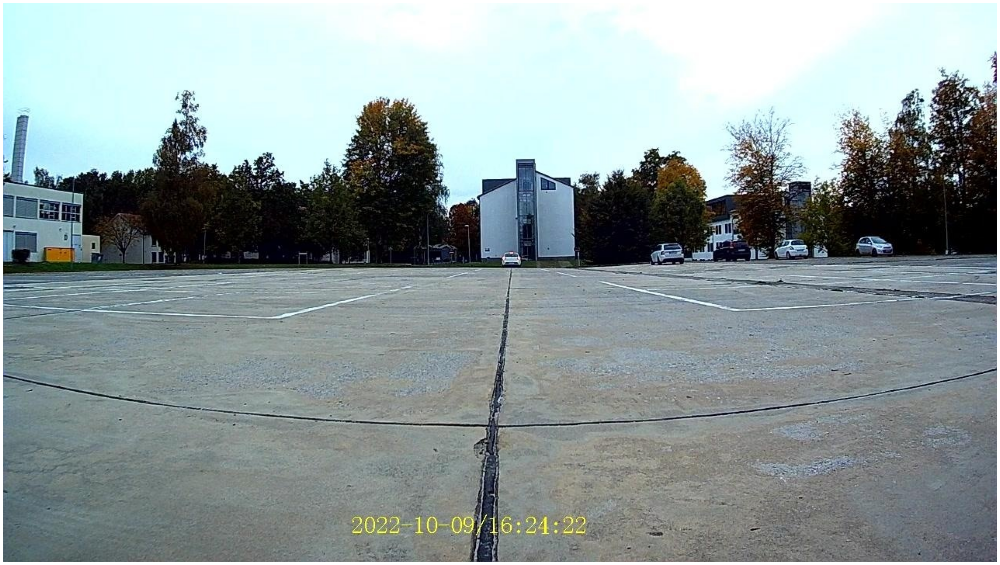

In [12]:
plt.figure(figsize=(40,30)) # Size of the Figure
plt.axis("off") # Deletes the axis
plt.imshow(img) 

Can use matplotlib.pyplot.scatter to visualize the point clouds, but only 2D.

For 3D we can use plotly.graph_objects:

In [13]:
data = [go.Scatter3d(x = pc_radar[:,0],
                     y = pc_radar[:,1],
                     z = pc_radar[:,2],
                    mode='markers', type='scatter3d',
                    text=np.arange(pc_radar.shape[0]),
                    marker={
                        'size': 2,
                        'color': pc_radar[:,2],
                        'colorscale':'rainbow',
})
]

go.Figure(data=data)

In [14]:
data = [go.Scatter3d(x = pc_radar[:,0],
                     y = pc_radar[:,1],
                     z = pc_radar[:,2],
                    mode='markers', type='scatter3d',
                    text=np.arange(pc_radar.shape[0]),
                    marker={
                        'size': 2,
                        'color': pc_radar[:,2],
                        'colorscale':'rainbow',
})
]
layout = go.Layout(
    scene={
        'xaxis': {'range': [-20, 20]},
        'yaxis': {'range': [0, 40]},
        'zaxis': {'range': [-20., 20.]},
    }
                        
)
go.Figure(data=data,layout=layout)

In [15]:
data = [     
                go.Scatter3d(x = pc_radar[:,0],
                    y = pc_radar[:,1],
                    z = pc_radar[:,2],
                    mode='markers', type='scatter3d',
                    text=np.arange(pc_radar.shape[0]),
                    marker={
                        'size': 2,
                        'color': "blue",
                        'colorscale':'rainbow',
})
]
layout = go.Layout(
    scene={
        'xaxis': {'range': [-20, 20], 'rangemode': 'tozero', 'tick0': -5},
        'yaxis': {'range': [0, 40], 'rangemode': 'tozero', 'tick0': -5},
        'zaxis': {'range': [-20., 20.], 'rangemode': 'tozero'}
    }
)
go.Figure(data=data, layout = layout)

In [16]:
def isolate_dynamic_from_static_points(pc_radar):
    r_velocity=pc_radar[:,3]
    dynamic_points_arr = r_velocity[np.nonzero(r_velocity)]
    x = pc_radar[:,0]
    y = pc_radar[:,1]

    x_axis = []
    y_axis = []
    
    dynamic_index = np.nonzero(r_velocity)

    for i in dynamic_index:
        x_axis.append(x[i])
        y_axis.append(y[i])

    return x_axis, y_axis


In [17]:
isolate_dynamic_from_static_points(pc_radar)

([array([ 5.73227549e+00,  4.09250450e+00,  3.22375798e+00,  2.45706034e+00,
          1.73896149e-13,  5.67495823e+00,  4.05922270e+00,  3.29496837e+00,
          2.41271877e+00,  8.11844528e-01,  1.78898901e-13, -8.23742092e-01,
         -1.64713597e+00,  4.14093637e+00,  3.27084279e+00,  2.48576283e+00,
          8.28412473e-01, -8.10378313e-01, -1.63095438e+00, -3.63378983e+01,
          6.42819643e+00,  5.64157629e+00,  4.04073429e+00,  3.27558613e+00,
          2.41057372e+00,  1.77846548e-13,  6.59152794e+00,  5.76706457e+00,
          4.11783981e+00,  3.24283338e+00,  2.47159910e+00,  1.75217452e-13,
         -8.04239631e-01])],
 [array([52.39699936, 52.52496719, 51.77535629, 52.66028976, 51.5512619 ,
         51.87308121, 52.09781265, 52.91903687, 51.70995331, 52.24940491,
         53.03431702, 53.01511765, 52.98471451, 53.14656448, 52.53156662,
         53.27544785, 53.31570053, 52.15504074, 52.46419144, 37.16353226,
         51.31915283, 51.56794357, 51.86052322, 52.60774612

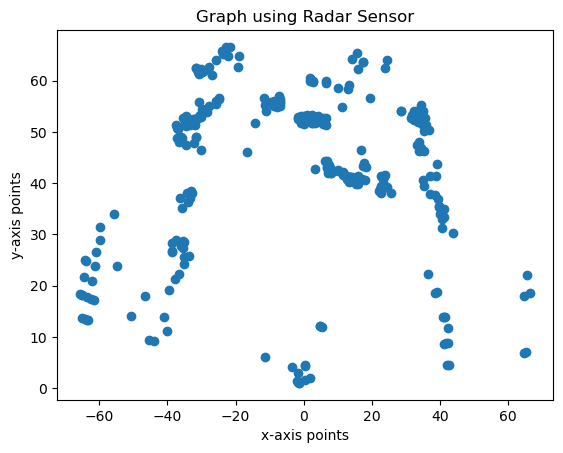

In [18]:
x_radar_points=pc_radar[:, 0]
y_radar_points=pc_radar[:, 1]
plt.scatter(x_radar_points,y_radar_points)
plt.title("Graph using Radar Sensor")
plt.xlabel('x-axis points')
plt.ylabel('y-axis points')
plt.show-

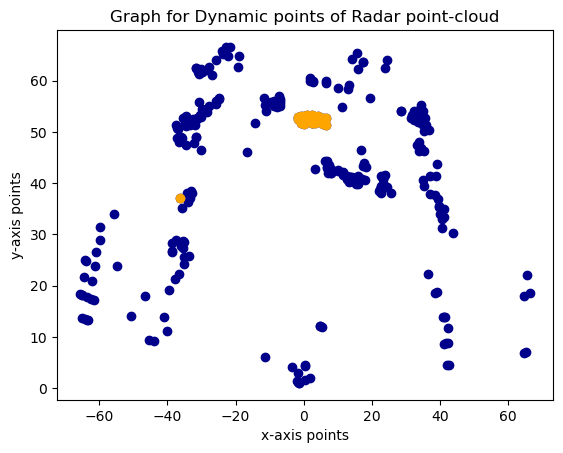

In [19]:
x_axis,y_axis = isolate_dynamic_from_static_points(pc_radar)
plt.title("Graph for Dynamic points of Radar point-cloud")

plt.scatter(x_radar_points,y_radar_points, color='darkblue')
plt.scatter(x_axis,y_axis, color='orange')

plt.xlabel('x-axis points')
plt.ylabel('y-axis points')
plt.show()

In [20]:
def calculate_distance_to_centre(x_axis, y_axis):
    center_x = np.mean(x_axis)
    center_y = np.mean(y_axis)
    
    dist = math.sqrt((center_x*center_x)+(center_y*center_y))
    print(dist)
    return dist

In [21]:
calculate_distance_to_centre(x_axis, y_axis)

51.94261897156053


51.94261897156053

In [22]:
root = f"C:/Users/IEM-Laptop15/Downloads/record3/record3/"
distance = []

for i in range(295):
    pc_radar = readPC(f"{root}/radar/{i:06d}.csv")
    x_axis, y_axis = isolate_dynamic_from_static_points(pc_radar)
    dist = calculate_distance_to_centre(x_axis, y_axis)
    distance.append(dist)
    
print(len(distance))

52.85379708278563
51.94261897156053
52.54834498935594
51.94586175786757
51.96382861865473
51.21735909863413
51.495972253526915
50.02754269360986
50.0530688285014
50.42293015317262
48.48413447614224
49.37420777013279
50.40225789667676
49.82102413373606
49.95719099711009
49.80759135493629
49.561967825987246
49.52556595815271
49.32022226368826
49.1160457463161
48.83862798849337
48.21594211721049
47.84887663933409
48.61815153806856
47.71834347420181
47.91607872427007
48.2544364277727
47.450278373676184
46.477994502724044
48.42634575152518
47.65828389027764
47.26387272799005
46.88367866891622
46.80393329258792
46.74338753922361
46.6563467193832
46.17688927177379
46.07610472148506
42.657710256419364
45.117897188054805
44.85352357225614
43.7773876320782
44.25178547856642
44.00352980735539
44.06525264857417
43.703561018994236
43.516281008876156
43.19781883742308
43.5903984291217
43.11565627914622
42.53713140467407
42.762934938747556
42.76505639042623
42.72667539453248
42.450433993828426
41.523

C:\Users\IEM-Laptop15\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning:

Mean of empty slice.

C:\Users\IEM-Laptop15\anaconda3\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning:

invalid value encountered in double_scalars



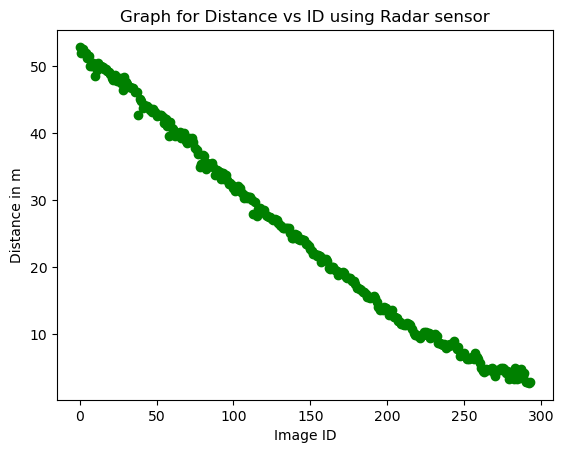

In [23]:
ID=[]
for i in range(295):
    ID.append(i)

plt.scatter(ID, distance, color='green')
plt.title("Graph for Distance vs ID using Radar sensor")
plt.ylabel('Distance in m')
plt.xlabel('Image ID')
plt.show()